In [1]:
import numpy as np
import skimage as sk
import skimage.io as skio
from numpy.lib.stride_tricks import sliding_window_view
import os

# General Helper Functions

In [2]:
def split_image(im):
    height = np.floor(im.shape[0] / 3.0).astype(int)
    b = im[:height]
    g = im[height: 2*height]
    r = im[2*height: 3*height]
    return b, g, r

In [3]:
def ncc_score(channel1, channel2):
    channel1_mean = np.average(channel1)
    channel2_mean = np.average(channel2)

    channel1_demeaned = channel1 - channel1_mean
    channel2_demeaned = channel2 - channel2_mean

    channel1_demeaned_norm = np.sqrt(np.sum(channel1_demeaned * channel1_demeaned))
    channel2_demeaned_norm = np.sqrt(np.sum(channel2_demeaned * channel2_demeaned))

    return np.sum(channel1_demeaned * channel2_demeaned) / (channel1_demeaned_norm * channel2_demeaned_norm)

In [ ]:
def l2_score(channel1, channel2):
    return -np.sqrt(np.sum((channel2 - channel1) * (channel2 - channel1)))

In [5]:
HORIZONTAL_KERNEL = np.array([[-1, -2, -1],
                              [0, 0, 0],
                              [1, 2, 1]])
VERTICAL_KERNEL = np.array([[-1, 0, 1],
                            [-2, 0, 2],
                            [-1, 0, 1]])
def preprocess_image_sobel(img, x_cropped, y_cropped):
    height, width = img.shape
    new_img = img[y_cropped:height - y_cropped, x_cropped:width - x_cropped]
    img_sliding_view = sliding_window_view(new_img, (3, 3))

    img_sliding_horizontal_multiplied = img_sliding_view * HORIZONTAL_KERNEL
    img_sliding_vertical_multiplied = img_sliding_view * VERTICAL_KERNEL
    img_sliding_horizontal = img_sliding_horizontal_multiplied.sum(axis=(-1, -2))
    img_sliding_vertical = img_sliding_vertical_multiplied.sum(axis=(-1, -2))

    res = np.sqrt(img_sliding_horizontal ** 2 + img_sliding_vertical ** 2)
    return res

In [6]:
def preprocess_all_channels(b, g, r, crop_ratio_x=0.1, crop_ratio_y=0.1):
    img_height, img_width = b.shape
    crop_x = np.floor(img_width * crop_ratio_x).astype(int)
    crop_y = np.floor(img_height * crop_ratio_y).astype(int)
    new_b = b[crop_y:img_height - crop_y, crop_x:img_width - crop_x]
    new_g = g[crop_y:img_height - crop_y, crop_x:img_width - crop_x]
    new_r = r[crop_y:img_height - crop_y, crop_x:img_width - crop_x]
    print(b.shape, g.shape, r.shape)
    print(new_b.shape, new_g.shape, new_r.shape)
    return new_b, new_g, new_r

In [7]:
def preprocess_all_channels_sobel(b, g, r):
    img_height, img_width = b.shape
    crop_x = np.floor(img_width / 20.0).astype(int)
    crop_y = np.floor(img_height / 20.0).astype(int)
    new_b = preprocess_image_sobel(b, crop_x, crop_y)
    new_g = preprocess_image_sobel(g, crop_x, crop_y)
    new_r = preprocess_image_sobel(r, crop_x, crop_y)
    return new_b, new_g, new_r

In [8]:
def find_best_alignment_naive(channel1_processed, channel2_processed, dx_list, dy_list):
    best_dx = dx_list[0]
    best_dy = dy_list[0]
    best_score = -float('inf')
    for dx in dx_list:
        for dy in dy_list:
            rolled = np.roll(channel2_processed, dx, axis=1)
            rolled = np.roll(rolled, dy, axis=0)
            score = ncc_score(channel1_processed, rolled)
            if score > best_score:
                best_score = score
                best_dx = dx
                best_dy = dy
    #print(f"Best dx: {best_dx}, best dy: {best_dy}")
    return best_dx, best_dy

In [9]:
def align_img(b, g, r):
    b_edges, g_edges, r_edges = preprocess_all_channels(b, g, r)
    dx_list = list(range(-15, 16, 1))
    dy_list = list(range(-15, 16, 1))
    best_dx_g, best_dy_g = find_best_alignment_naive(b_edges, g_edges, dx_list, dy_list)
    best_dx_r, best_dy_r = find_best_alignment_naive(b_edges, r_edges, dx_list, dy_list)
    rolled_g = np.roll(g, best_dx_g, axis=1)
    rolled_g = np.roll(rolled_g, best_dy_g, axis=0)
    rolled_r = np.roll(r, best_dx_r, axis=1)
    rolled_r = np.roll(rolled_r, best_dy_r, axis=0)
    im_out = np.dstack([rolled_r, rolled_g, b])
    #print(f"green x: {best_dx_g}, green y: {best_dy_g}, red x: {best_dx_r}, red y: {best_dy_r}")
    return im_out, best_dx_g, best_dy_g, best_dx_r, best_dy_r

In [10]:
def get_pyramid(img, num_layers=3):
    pyramid = []
    for _ in range(num_layers):
        pyramid.append(img)
        img = sk.transform.rescale(img, 0.5, anti_aliasing=True)
    return pyramid[::-1]

def find_best_alignment_pyramid(channel1, channel2, num_layers=3, search_half_length=15):
    pyramid_1 = get_pyramid(channel1, num_layers)
    pyramid_2 = get_pyramid(channel2, num_layers)
    curr_dx, curr_dy = 0, 0
    for i in range(len(pyramid_1)):
        curr_dx *= 2
        curr_dy *= 2
        curr_c1, curr_c2 = pyramid_1[i], pyramid_2[i]
        curr_dx_list = list(range(curr_dx - search_half_length, curr_dx + 1)) + list(range(curr_dx + 1, curr_dx + search_half_length + 1))
        curr_dy_list = list(range(curr_dy - search_half_length, curr_dy + 1)) + list(range(curr_dy + 1, curr_dy + search_half_length + 1))
        best_dx, best_dy = find_best_alignment_naive(curr_c1, curr_c2, curr_dx_list, curr_dy_list)
        curr_dx, curr_dy = best_dx, best_dy
    return curr_dx, curr_dy

In [11]:
def align_img_pyramid(b, g, r, num_layers=3, search_half_length=15, crop_x=0.1, crop_y=0.1):
    processed_b, processed_g, processed_r = preprocess_all_channels(b, g, r, crop_ratio_x=crop_x, crop_ratio_y=crop_y)
    best_dx_g, best_dy_g = find_best_alignment_pyramid(processed_b, processed_g, num_layers, search_half_length)
    best_dx_r, best_dy_r = find_best_alignment_pyramid(processed_b, processed_r, num_layers, search_half_length)
    rolled_g = np.roll(processed_g, best_dx_g, axis=1)
    rolled_g = np.roll(rolled_g, best_dy_g, axis=0)
    rolled_r = np.roll(processed_r, best_dx_r, axis=1)
    rolled_r = np.roll(rolled_r, best_dy_r, axis=0)
    im_out = np.dstack([rolled_r, rolled_g, processed_b])
    print(f"green x: {best_dx_g}, green y: {best_dy_g}, red x: {best_dx_r}, red y: {best_dy_r}")
    return im_out

In [12]:
def align_img_pyramid_to_g(b, g, r, num_layers=3, search_half_length=15, crop_x=0.1, crop_y=0.1):
    processed_b, processed_g, processed_r = preprocess_all_channels(b, g, r, crop_ratio_x=crop_x, crop_ratio_y=crop_y)
    best_dx_b, best_dy_b = find_best_alignment_pyramid(processed_g, processed_b, num_layers, search_half_length)
    best_dx_r, best_dy_r = find_best_alignment_pyramid(processed_g, processed_r, num_layers, search_half_length)
    rolled_b = np.roll(b, best_dx_b, axis=1)
    rolled_b = np.roll(rolled_b, best_dy_b, axis=0)
    rolled_r = np.roll(r, best_dx_r, axis=1)
    rolled_r = np.roll(rolled_r, best_dy_r, axis=0)
    im_out = np.dstack([rolled_r, g, rolled_b])
    #print(f"blue x: {best_dx_b}, blue y: {best_dy_b}, red x: {best_dx_r}, red y: {best_dy_r}")
    return im_out, best_dx_b, best_dy_b, best_dx_r, best_dy_r

# Part 1: Single Scale

In [13]:
imnames = ['cathedral.jpg', 'monastery.jpg', 'tobolsk.jpg']

(341, 390) (341, 390) (341, 390)
(273, 312) (273, 312) (273, 312)
green x: 2, green y: 5, red x: 3, red y: 12


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_66673/2225799184.py:14: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_66673/2225799184.py:15: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


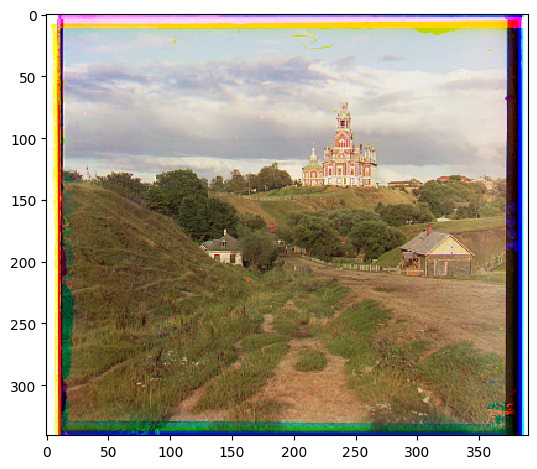

(341, 391) (341, 391) (341, 391)
(273, 313) (273, 313) (273, 313)
green x: 2, green y: -3, red x: 2, red y: 3


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_66673/2225799184.py:14: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_66673/2225799184.py:15: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


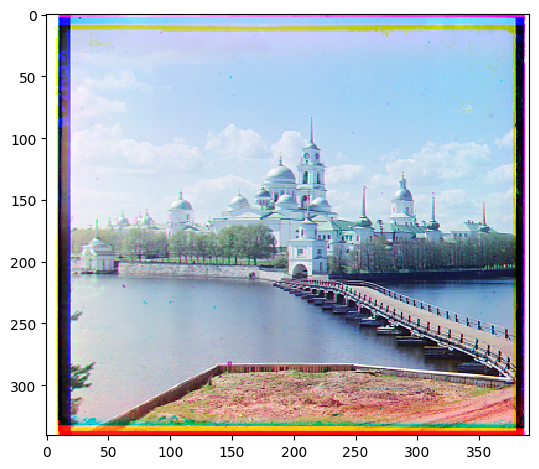

(341, 396) (341, 396) (341, 396)
(273, 318) (273, 318) (273, 318)
green x: 3, green y: 3, red x: 3, red y: 6


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_66673/2225799184.py:14: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_66673/2225799184.py:15: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


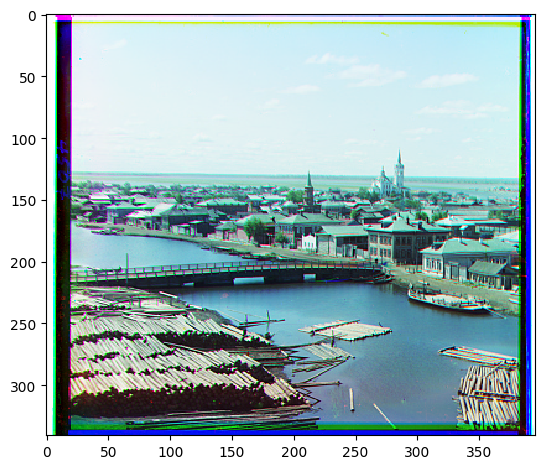

In [14]:
shifts_naive = {}
for img_name in imnames:
    im = skio.imread(f"data/cs180_proj1_data/{img_name}")
    im = sk.img_as_float(im)
    b, g, r = split_image(im)
    img, best_dx_g, best_dy_g, best_dx_r, best_dy_r = align_img(b, g, r)
    print(f"green x: {best_dx_g}, green y: {best_dy_g}, red x: {best_dx_r}, red y: {best_dy_r}")
    curr_shift = {}
    curr_shift['best_dx_g'] = best_dx_g
    curr_shift['best_dy_g'] = best_dy_g
    curr_shift['best_dx_r'] = best_dx_r
    curr_shift['best_dy_r'] = best_dy_r
    shifts_naive[img_name] = curr_shift
    skio.imshow(img)
    skio.show()
    img_actual_name = img_name.split('.')[0]
    img_out = (img * 255).astype(np.uint8)
    skio.imsave(f"data/out_naive/{img_actual_name}.jpg", img_out)

# Part 2: Multi Scale

## 2.1: Given Images

(3209, 3702) (3209, 3702) (3209, 3702)
(1927, 2222) (1927, 2222) (1927, 2222)
blue x: -24, blue y: -49, red x: 17, red y: 57


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:16: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:17: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


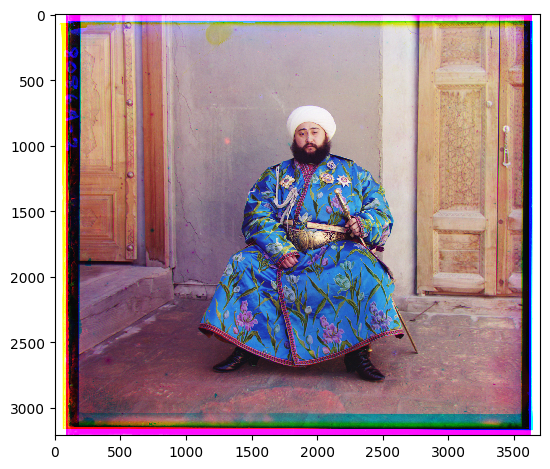

(3231, 3719) (3231, 3719) (3231, 3719)
(1939, 2233) (1939, 2233) (1939, 2233)
blue x: -21, blue y: -38, red x: 15, red y: 39


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:16: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:17: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


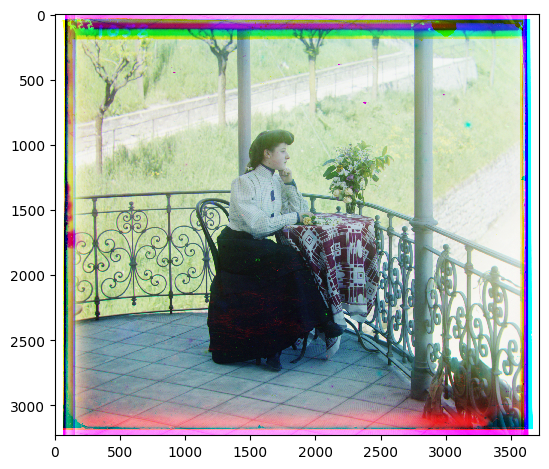

(341, 391) (341, 391) (341, 391)
(205, 235) (205, 235) (205, 235)
blue x: -2, blue y: 3, red x: 1, red y: 6


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:16: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:17: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


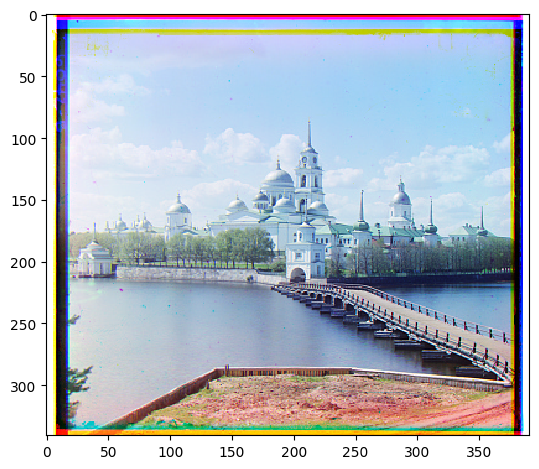

(3202, 3634) (3202, 3634) (3202, 3634)
(1922, 2182) (1922, 2182) (1922, 2182)
blue x: -4, blue y: -25, red x: -8, red y: 33


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:16: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:17: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


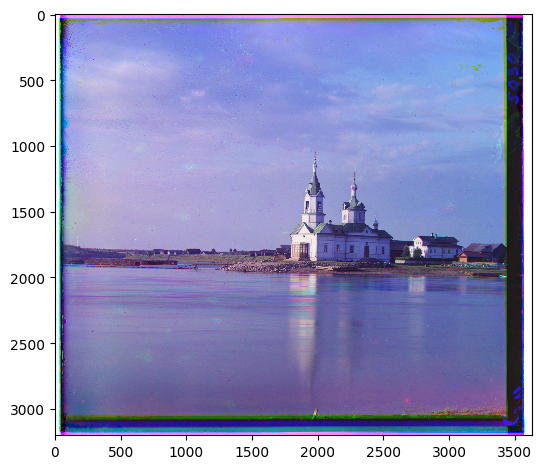

(3209, 3714) (3209, 3714) (3209, 3714)
(1927, 2230) (1927, 2230) (1927, 2230)
blue x: -14, blue y: -50, red x: -3, red y: 59


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:16: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:17: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


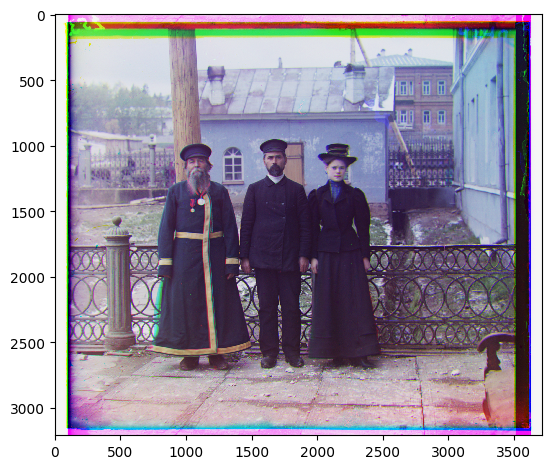

(3244, 3779) (3244, 3779) (3244, 3779)
(1948, 2269) (1948, 2269) (1948, 2269)
blue x: 16, blue y: -41, red x: -13, red y: 52


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:16: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:17: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


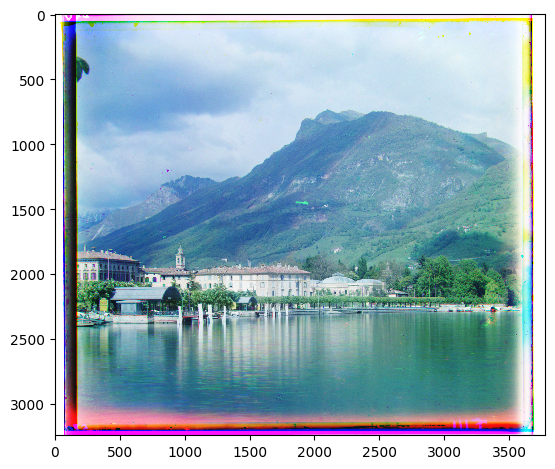

(3241, 3770) (3241, 3770) (3241, 3770)
(1945, 2262) (1945, 2262) (1945, 2262)
blue x: -10, blue y: -81, red x: 3, red y: 96


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:16: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:17: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


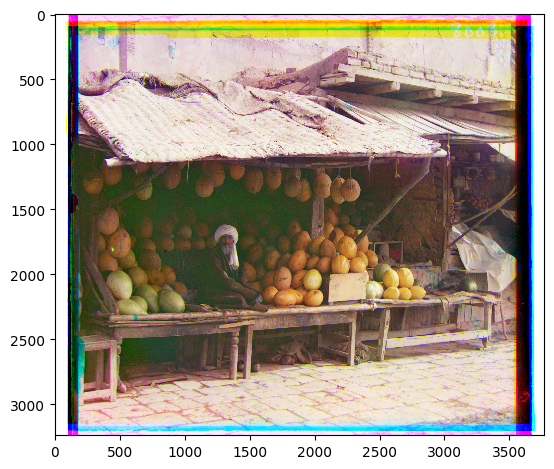

(3241, 3700) (3241, 3700) (3241, 3700)
(1945, 2220) (1945, 2220) (1945, 2220)
blue x: 2, blue y: 2, red x: -7, red y: 78


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:16: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:17: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


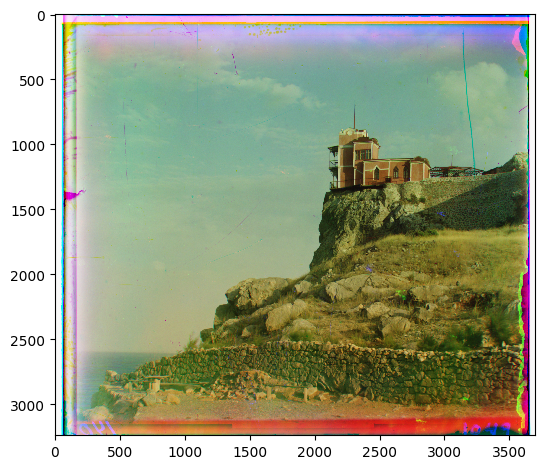

(341, 396) (341, 396) (341, 396)
(205, 238) (205, 238) (205, 238)
blue x: -3, blue y: -3, red x: 1, red y: 4


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:16: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:17: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


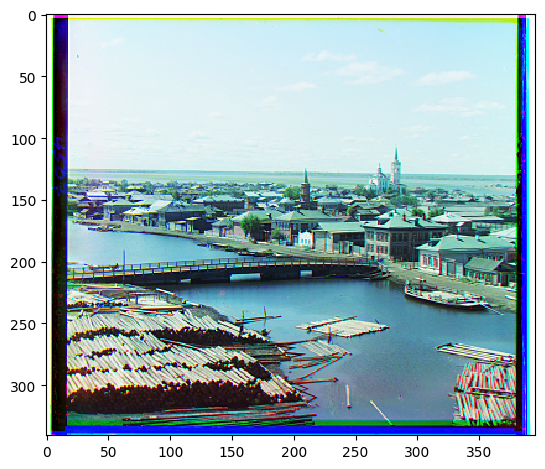

(3244, 3741) (3244, 3741) (3244, 3741)
(1948, 2245) (1948, 2245) (1948, 2245)
blue x: -17, blue y: -40, red x: 5, red y: 48


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:16: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:17: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


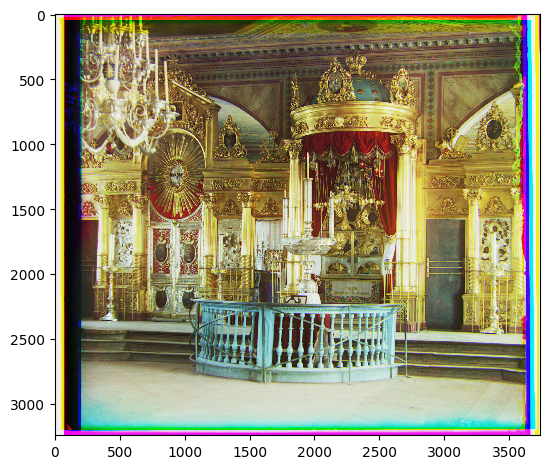

(341, 390) (341, 390) (341, 390)
(205, 234) (205, 234) (205, 234)
blue x: -2, blue y: -5, red x: 1, red y: 7


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:16: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:17: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


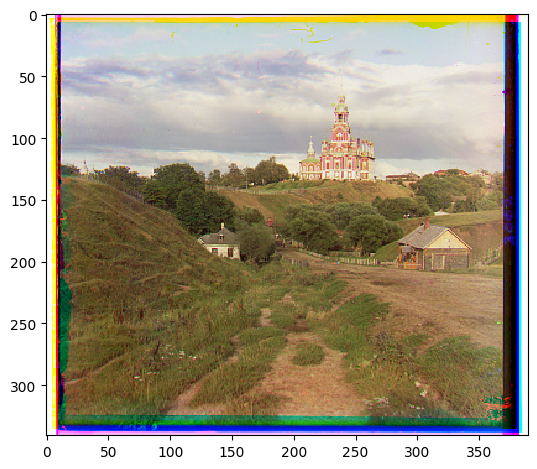

(3250, 3817) (3250, 3817) (3250, 3817)
(1950, 2291) (1950, 2291) (1950, 2291)
blue x: 5, blue y: -49, red x: -19, red y: 47


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:16: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:17: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


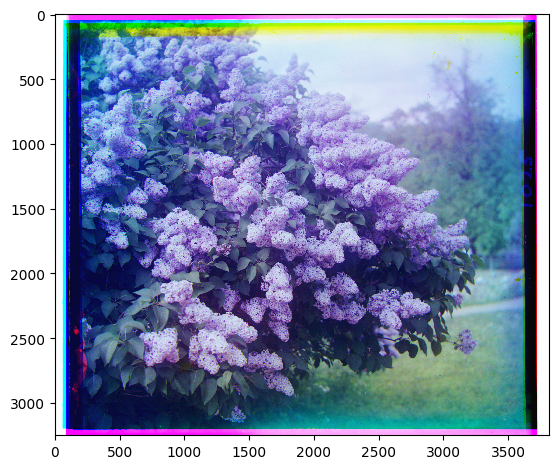

(3251, 3810) (3251, 3810) (3251, 3810)
(1951, 2286) (1951, 2286) (1951, 2286)
blue x: -29, blue y: -78, red x: 8, red y: 98


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:16: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:17: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


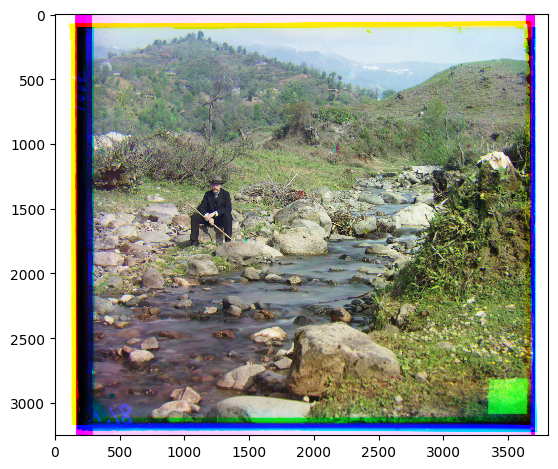

(3218, 3683) (3218, 3683) (3218, 3683)
(1932, 2211) (1932, 2211) (1932, 2211)
blue x: -17, blue y: -59, red x: -3, red y: 65


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:16: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/3508787400.py:17: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


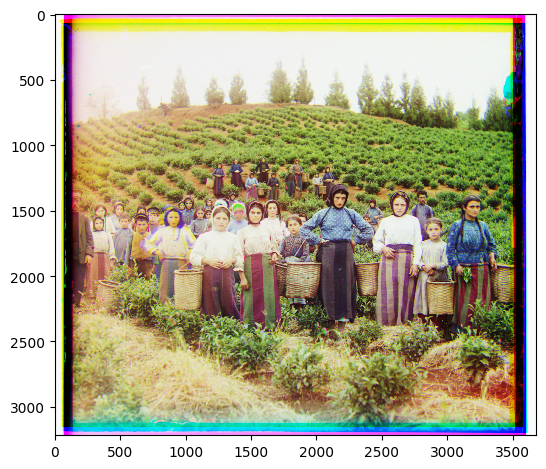

In [13]:
shifts = {}
for img_name in os.listdir("data/cs180_proj1_data"):
    if img_name == '.DS_Store':
        continue
    im = skio.imread(f"data/cs180_proj1_data/{img_name}")
    im = sk.img_as_float(im)
    b, g, r = split_image(im)
    img, best_dx_b, best_dy_b, best_dx_r, best_dy_r = align_img_pyramid_to_g(b, g, r, num_layers=4, search_half_length=12, crop_x=0.2, crop_y=0.2)
    print(f"blue x: {best_dx_b}, blue y: {best_dy_b}, red x: {best_dx_r}, red y: {best_dy_r}")
    curr_shift = {}
    curr_shift['best_dx_b'] = best_dx_b
    curr_shift['best_dy_b'] = best_dy_b
    curr_shift['best_dx_r'] = best_dx_r
    curr_shift['best_dy_r'] = best_dy_r
    shifts[img_name] = curr_shift
    skio.imshow(img)
    skio.show()
    img_actual_name = img_name.split('.')[0]
    img_out = (img * 255).astype(np.uint8)
    skio.imsave(f"data/out/{img_actual_name}.jpg", img_out)

## 2.2: Self Chosen Images

(3244, 3751) (3244, 3751) (3244, 3751)
(1948, 2251) (1948, 2251) (1948, 2251)
blue x: 11, blue y: -35, red x: -21, red y: 57


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/1754853165.py:16: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/1754853165.py:17: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


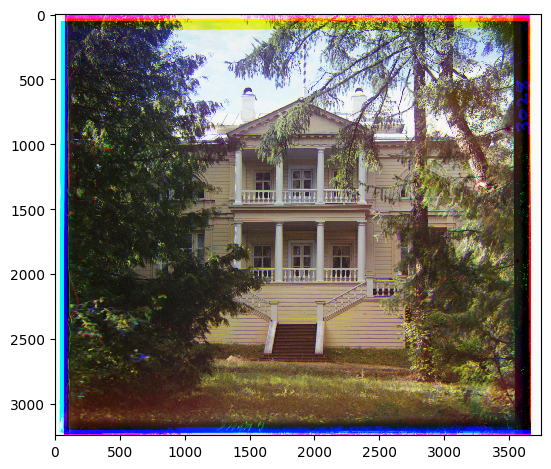

(3267, 3790) (3267, 3790) (3267, 3790)
(1961, 2274) (1961, 2274) (1961, 2274)
blue x: 7, blue y: -67, red x: -12, red y: 75


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/1754853165.py:16: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/1754853165.py:17: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


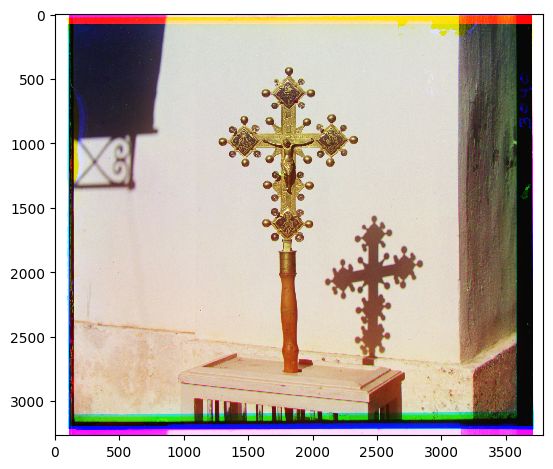

(3192, 3723) (3192, 3723) (3192, 3723)
(1916, 2235) (1916, 2235) (1916, 2235)
blue x: -19, blue y: -28, red x: 3, red y: 49


/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/1754853165.py:16: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.imshow(img)
/var/folders/zd/6l9_l17d02d4msw14wpqz0lw0000gn/T/ipykernel_62510/1754853165.py:17: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  skio.show()


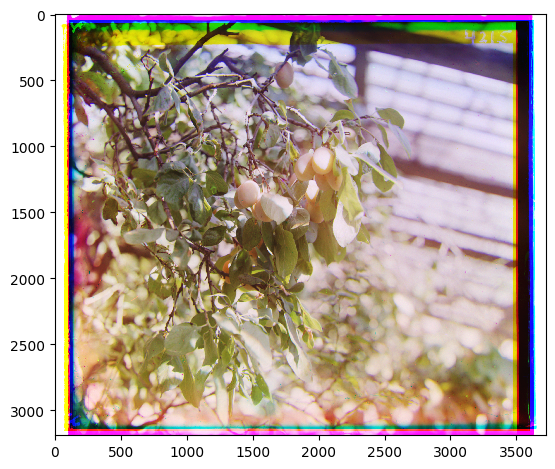

In [27]:
self_chosen_imgs_shifts = {}
for img_name in os.listdir("data/self_chosen_data"):
    if img_name == '.DS_Store':
        continue
    im = skio.imread(f"data/self_chosen_data/{img_name}")
    im = sk.img_as_float(im)
    b, g, r = split_image(im)
    img, best_dx_b, best_dy_b, best_dx_r, best_dy_r = align_img_pyramid_to_g(b, g, r, num_layers=4, search_half_length=12, crop_x=0.2, crop_y=0.2)
    print(f"blue x: {best_dx_b}, blue y: {best_dy_b}, red x: {best_dx_r}, red y: {best_dy_r}")
    curr_shift = {}
    curr_shift['best_dx_b'] = best_dx_b
    curr_shift['best_dy_b'] = best_dy_b
    curr_shift['best_dx_r'] = best_dx_r
    curr_shift['best_dy_r'] = best_dy_r
    self_chosen_imgs_shifts[img_name] = curr_shift
    skio.imshow(img)
    skio.show()
    img_actual_name = img_name.split('.')[0]
    img_out = (img * 255).astype(np.uint8)
    skio.imsave(f"data/out/{img_actual_name}.jpg", img_out)

In [23]:
shifts['three_generations.tif']

{'best_dx_b': -14, 'best_dy_b': -50, 'best_dx_r': -3, 'best_dy_r': 59}